# Lending_club_case_study

## Install additional libraries

In [1]:
!pip install -q -U autoviz          

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 KB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 KB 19.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.0/121.0 KB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 KB 7.2 MB/s eta 0:00:00


## Import required libraries

In [25]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from autoviz.AutoViz_Class import AutoViz_Class

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


## Creating dataframe

In [3]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [4]:
df=pd.read_csv('/content/drive/MyDrive/UpGrad/loan.csv')

In [5]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [7]:
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


## Handle missing values

In [8]:
df.isna().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [9]:
limit= len(df)*0.7                      ## we will remove those columns which has 30% or beyond missing values
df=df.dropna(thresh=limit,axis=1)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 53 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

## Remove unnecessary features

In [11]:
for column in df:
  print('column: {} and {}'.format(column,df[column].unique()))               # it will help us to decide which columns are useful 
                                                                              # Removing those columns which have one categorical values

column: id and [1077501 1077430 1077175 ...   90395   90376   87023]
column: member_id and [1296599 1314167 1313524 ...   90390   89243   86999]
column: loan_amnt and [ 5000  2500  2400 10000  3000  7000  5600  5375  6500 12000  9000  1000
  3600  6000  9200 20250 21000 15000  4000  8500  4375 31825 12400 10800
 12500  9600  4400 14000 11000 25600 16000  7100 13000 17500 17675  8000
  3500 16425  8200 20975  6400 14400  7250 18000 35000 11800  4500 10500
 15300 20000  6200  7200  9500 18825 24000  2100  5500 26800 25000 19750
 13650 28000 10625  8850  6375 11100  4200  8875 13500 21600  8450 13475
 22000  7325  7750 13350 22475  8400 13250  7350 11500 29500  2000 11625
 15075  5300  8650  7400 24250 26000  1500 19600  4225 16500 15600 14125
 13200 12300  1400  3200 11875  1800 23200  4800  7300 10400  6600 30000
  4475  6300  8250  9875 21500  7800  9750 15550 17000  7500  5800  8050
  5400  4125  9800 15700  9900  6250 10200 23000 25975 21250 33425  8125
 18800 19200 12875  2625 11300

In [12]:
df.drop(['id','member_id','grade','emp_title','issue_d','pymnt_plan','url',
         'zip_code','addr_state','inq_last_6mths','initial_list_status','out_prncp_inv',
         'total_pymnt_inv','total_rec_late_fee','recoveries','collection_recovery_fee','collections_12_mths_ex_med',
         'application_type','tax_liens','chargeoff_within_12_mths','delinq_amnt','policy_code','acc_now_delinq',
         'funded_amnt','funded_amnt_inv','revol_bal','revol_util','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','earliest_cr_line'],axis=1,inplace=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39717 non-null  int64  
 1   term                  39717 non-null  object 
 2   int_rate              39717 non-null  object 
 3   installment           39717 non-null  float64
 4   sub_grade             39717 non-null  object 
 5   emp_length            38642 non-null  object 
 6   home_ownership        39717 non-null  object 
 7   annual_inc            39717 non-null  float64
 8   verification_status   39717 non-null  object 
 9   loan_status           39717 non-null  object 
 10  purpose               39717 non-null  object 
 11  title                 39706 non-null  object 
 12  dti                   39717 non-null  float64
 13  delinq_2yrs           39717 non-null  int64  
 14  open_acc              39717 non-null  int64  
 15  pub_rec            

In [14]:
df.isnull().sum()

loan_amnt                  0
term                       0
int_rate                   0
installment                0
sub_grade                  0
emp_length              1075
home_ownership             0
annual_inc                 0
verification_status        0
loan_status                0
purpose                    0
title                     11
dti                        0
delinq_2yrs                0
open_acc                   0
pub_rec                    0
total_acc                  0
out_prncp                  0
total_pymnt                0
total_rec_prncp            0
total_rec_int              0
pub_rec_bankruptcies     697
dtype: int64

## Filling missing values

In [15]:
df['emp_length'].fillna(df['emp_length'].mode()[0],inplace=True)           ## categorical columns filled with mode

In [16]:
df['title'].fillna(df['title'].mode()[0],inplace=True)
df['pub_rec_bankruptcies'].fillna(df['pub_rec_bankruptcies'].mode()[0],inplace=True)          ## emp_length shows float dtype , but we imputed it with mode 

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39717 non-null  int64  
 1   term                  39717 non-null  object 
 2   int_rate              39717 non-null  object 
 3   installment           39717 non-null  float64
 4   sub_grade             39717 non-null  object 
 5   emp_length            39717 non-null  object 
 6   home_ownership        39717 non-null  object 
 7   annual_inc            39717 non-null  float64
 8   verification_status   39717 non-null  object 
 9   loan_status           39717 non-null  object 
 10  purpose               39717 non-null  object 
 11  title                 39717 non-null  object 
 12  dti                   39717 non-null  float64
 13  delinq_2yrs           39717 non-null  int64  
 14  open_acc              39717 non-null  int64  
 15  pub_rec            

In [18]:
df.head()

,loan_amnt,term,int_rate,installment,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,...,dti,delinq_2yrs,open_acc,pub_rec,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,pub_rec_bankruptcies
0,5000,36 months,10.65%,162.87,B2,10+ years,RENT,24000.0,Verified,Fully Paid,...,27.65,0,3,0,9,0.00,5863.155187,5000.00,863.16,0.0
1,2500,60 months,15.27%,59.83,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,...,1.00,0,3,0,4,0.00,1008.710000,456.46,435.17,0.0
2,2400,36 months,15.96%,84.33,C5,10+ years,RENT,12252.0,Not Verified,Fully Paid,...,8.72,0,2,0,10,0.00,3005.666844,2400.00,605.67,0.0
3,10000,36 months,13.49%,339.31,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,...,20.00,0,10,0,37,0.00,12231.890000,10000.00,2214.92,0.0
4,3000,60 months,12.69%,67.79,B5,1 year,RENT,80000.0,Source Verified,Current,...,17.94,0,15,0,38,524.06,3513.330000,2475.94,1037.39,0.0


## Correlation matrix will give us idea that how numeric features are correlated with each other


In [23]:
df_corr=df.corr()
df_corr

,loan_amnt,installment,annual_inc,dti,delinq_2yrs,open_acc,pub_rec,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,pub_rec_bankruptcies
loan_amnt,1.000000,0.930288,0.271149,0.066439,-0.031864,0.177168,-0.051236,0.256442,0.192937,0.886613,0.852021,0.729726,-0.036284
installment,0.930288,1.000000,0.270874,0.054186,-0.019657,0.172812,-0.046532,0.230824,0.125082,0.856928,0.850773,0.634725,-0.033746
annual_inc,0.271149,0.270874,1.000000,-0.122732,0.023083,0.158200,-0.018689,0.235771,0.033573,0.257980,0.259571,0.185476,-0.016514
dti,0.066439,0.054186,-0.122732,1.000000,-0.034452,0.288045,-0.004621,0.229881,0.036095,0.064766,0.041316,0.106071,0.007021
delinq_2yrs,-0.031864,-0.019657,0.023083,-0.034452,1.000000,0.011656,0.007463,0.067892,-0.003008,-0.022695,-0.038795,0.023077,0.002954
open_acc,0.177168,0.172812,0.158200,0.288045,0.011656,1.000000,0.000172,0.686635,0.028688,0.162663,0.160631,0.124499,0.005763
pub_rec,-0.051236,-0.046532,-0.018689,-0.004621,0.007463,0.000172,1.000000,-0.023901,-0.012675,-0.053668,-0.065384,-0.007470,0.843032
total_acc,0.256442,0.230824,0.235771,0.229881,0.067892,0.686635,-0.023901,1.000000,0.031191,0.225077,0.231242,0.147792,-0.010757
out_prncp,0.192937,0.125082,0.033573,0.036095,-0.003008,0.028688,-0.012675,0.031191,1.000000,0.239367,0.166519,0.383746,-0.009506
total_pymnt,0.886613,0.856928,0.257980,0.064766,-0.022695,0.162663,-0.053668,0.225077,0.239367,1.000000,0.971472,0.828758,-0.042579


## Checking Outliers

In [42]:
df1=df.select_dtypes(exclude='object')   ## creating dataframe which include only numeric columns

In [46]:
col=df1.columns.values              ## Assign all column values to col

array(['loan_amnt', 'installment', 'annual_inc', 'dti', 'delinq_2yrs',
       'open_acc', 'pub_rec', 'total_acc', 'out_prncp', 'total_pymnt',
       'total_rec_prncp', 'total_rec_int', 'pub_rec_bankruptcies'],
      dtype=object)

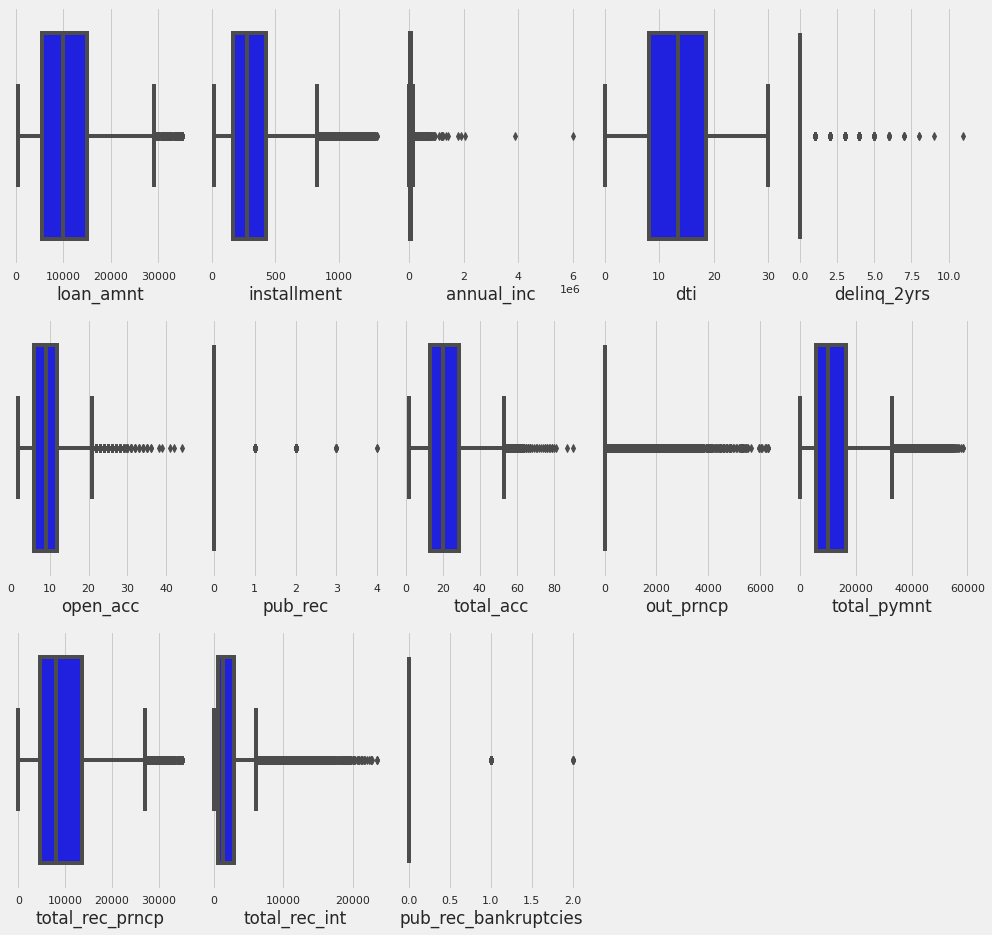

In [50]:
plt.figure(figsize=(14,30))
for i in range(0,len(col)):
  plt.subplot(7,5,i+1)
  ax=sns.boxplot(df[col[i]],color='blue')
  plt.tight_layout()


### We can remove these outliers using percentile method: <br>
for col in df1.columns:
  percentile=df1[col].quantile([0.01,0.98]).values<br>
  df1[col][df1[col]<=percentile[0]]=percentile[0]<br>
  df1[col][df1[col]>=percentile[1]]=percentile[1]<br>


### after this we can merge two dataframes which have numeric columns and categorical columns with removed outliers

# Checking skwenes

In [45]:
df.skew()

loan_amnt                1.059317
installment              1.128419
annual_inc              30.949185
dti                     -0.028043
delinq_2yrs              5.022035
open_acc                 1.003762
pub_rec                  4.538051
total_acc                0.827379
out_prncp                9.226730
total_pymnt              1.339857
total_rec_prncp          1.118255
total_rec_int            2.668747
pub_rec_bankruptcies     4.599421
dtype: float64

### we can remove this skewness using power_transform method

# EDA

## Let's create csv file and apply AutoViz library for EDA

In [24]:
df.to_csv('loan_updated.csv')

In [26]:
av=AutoViz_Class()

Shape of your Data Set loaded: (39717, 23)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  8
    Number of Integer-Categorical Columns =  5
    Number of String-Categorical Columns =  6
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    23 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 36


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

Could not draw wordcloud plot for int_rate
All Plots done
Time to run AutoViz = 74 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


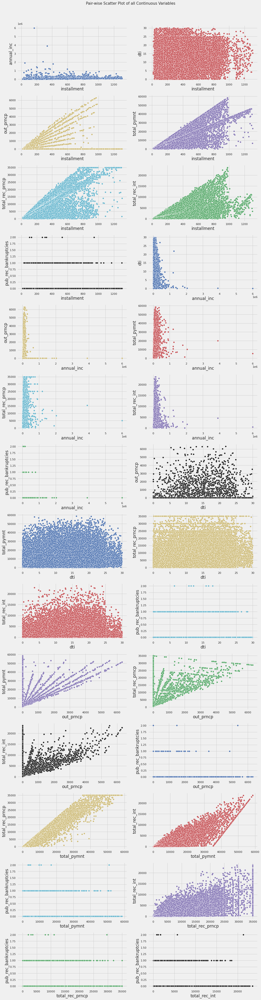

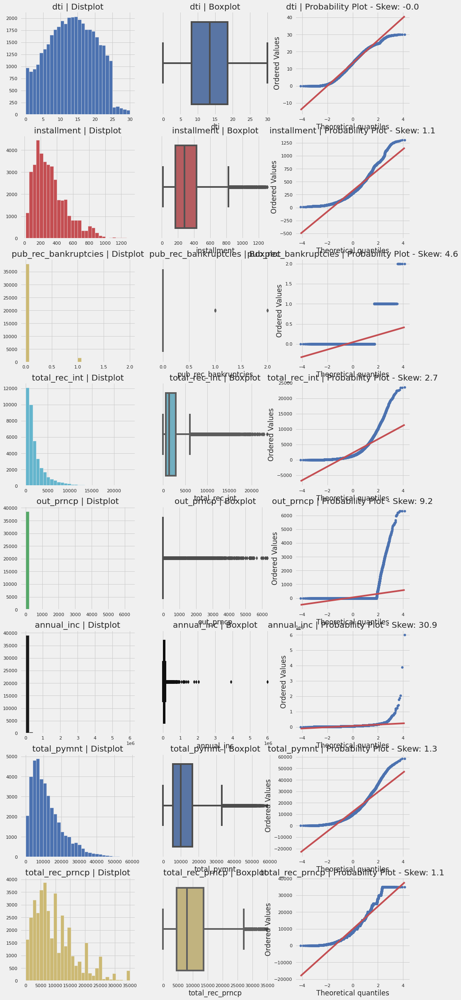

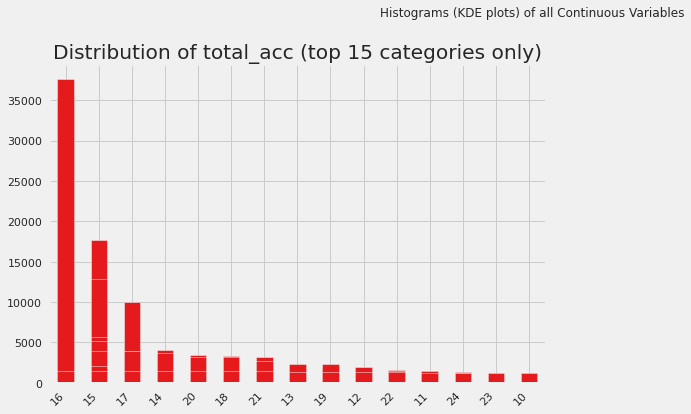

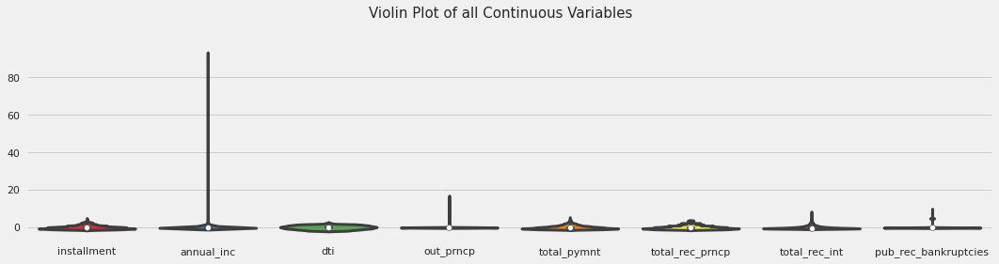

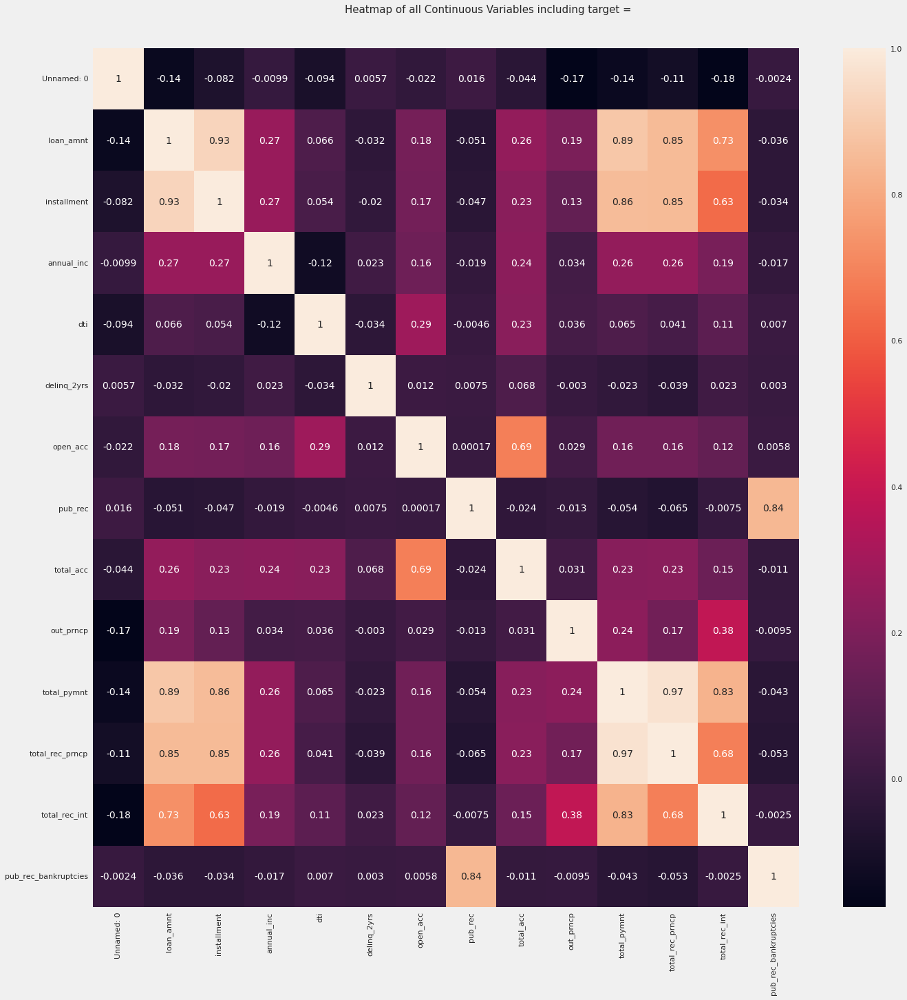

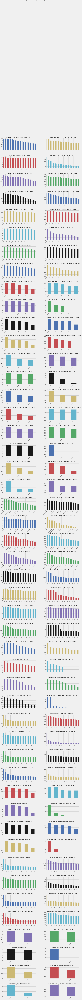

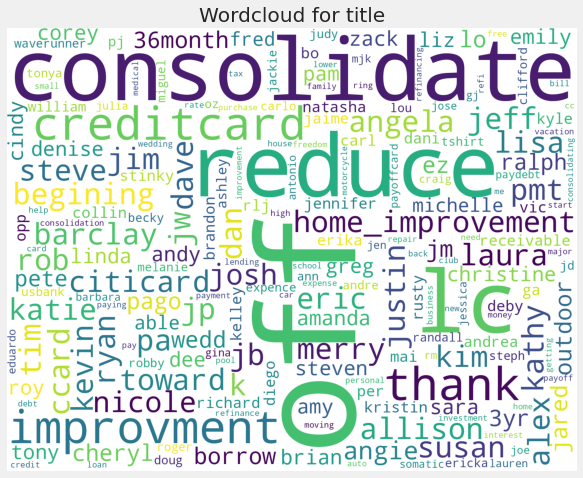

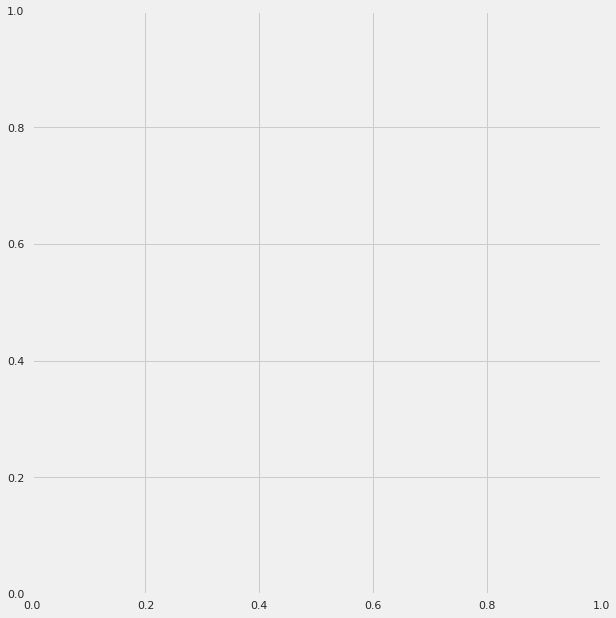

In [27]:
filename="/content/loan_updated.csv"
sep=",",
dft=av.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=None,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=40
)

# Observations:<br>
1) 